In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os
import os.path as osp
from skimage.exposure import rescale_intensity
#from cytokit.cytometry import cytometer
from cytokit.ops.cytometry import Cytometry2D
from cytokit import config as ckconfig
from skimage import io as skio
from cytokit import io as ckio

exp_name = '20180101_codex_mouse_spleen_balbc_slide1'
conf_path = osp.join(os.environ['CYTOKIT_ANALYSIS_REPO_DIR'], 'config/experiment/20180101_codex_spleen', exp_name, 'experiment.yaml')
out_path = osp.join(os.environ['CYTOKIT_DATA_DIR'], '20180101_codex_spleen/20180101_codex_mouse_spleen_balbc_slide1/output/v00')
config = ckconfig.load(conf_path)
config.register_environment()
#img_path = osp.join(os.environ['CYTOKIT_DATA_DIR'], '20180101_codex_spleen/20180101_codex_mouse_spleen_balbc_slide1/external/', montage_file)

In [2]:
tile = ckio.read_tile(osp.join(out_path, ckio.get_processor_img_path(0, 0, 0)))
tile.shape

/lab/repos/cytokit/python/pipeline/cytokit/io.py:118: UserWarning: ImageJ tags do not contain "axes" property (file = /lab/data/20180101_codex_spleen/20180101_codex_mouse_spleen_balbc_slide1/output/v00/processor/tile/BALBc-1_X01_Y01.tif, tags = {'min': 0.0, 'Ranges': (0.0, 19986.0, 0.0, 19986.0, 0.0, 19986.0), 'frames': 18, 'loop': False, 'mode': 'composite', 'slices': 15, 'images': 810, 'max': 19986.0, 'ImageJ': '1.50g', 'channels': 3, 'hyperstack': True})
  warnings.warn('ImageJ tags do not contain "axes" property (file = {}, tags = {})'.format(file, tags))


(18, 15, 3, 1008, 1344)

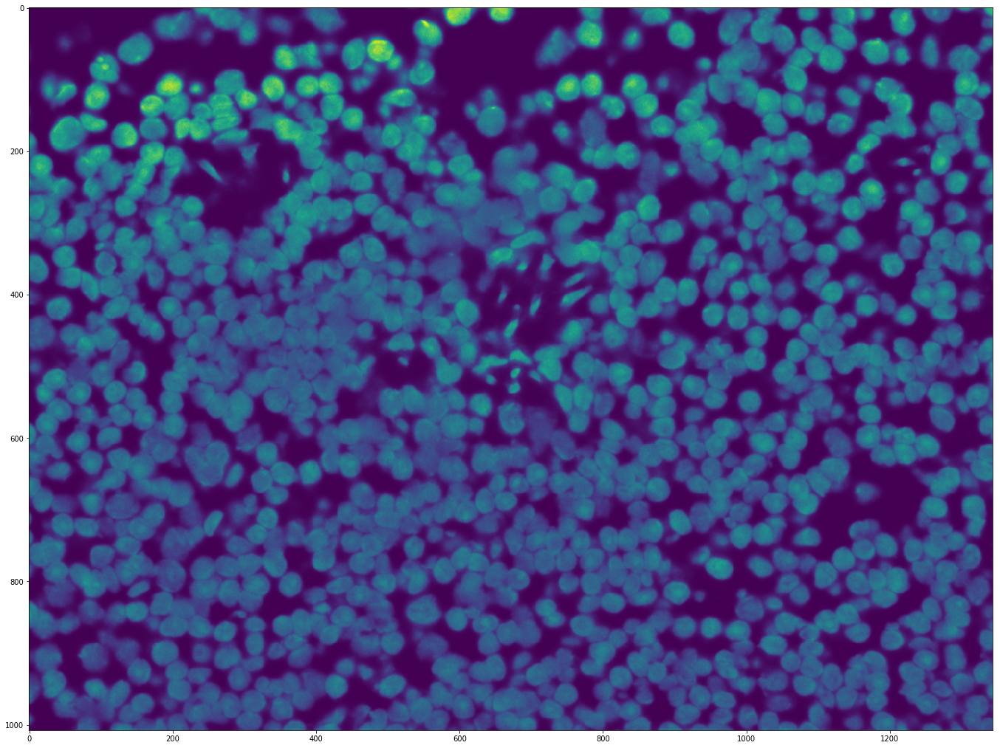

In [3]:
coords = config.get_channel_coordinates('nucl')
z = 8
img = tile[coords[0], z, coords[1]]
plt.imshow(img)
plt.gcf().set_size_inches(24, 18)

In [4]:
# coords = config.get_channel_coordinates('cd45')
# z = 8
# img = tile[coords[0], z, coords[1]]
# plt.imshow(img)
# plt.gcf().set_size_inches(24, 18)

In [5]:
config.cytometry_params['target_shape'] = [504, 672]
#config.cytometry_params['target_shape'] = [1008, 1344]
#config.cytometry_params['target_shape'] = [672, 896]

#config.cytometry_params['segmentation_params']['marker_dilation'] = 1
config.cytometry_params['segmentation_params']['marker_dilation'] = 3

config.cytometry_params['segmentation_params']['nucleus_dilation'] = 8

In [6]:
config.cytometry_params['target_shape']

[504, 672]

In [7]:
op = Cytometry2D(config)
op.initialize()

Using TensorFlow backend.


In [8]:
img_label, stats = op.run(tile, z_plane=z)

In [9]:
img_label.shape

(2, 15, 2, 1008, 1344)

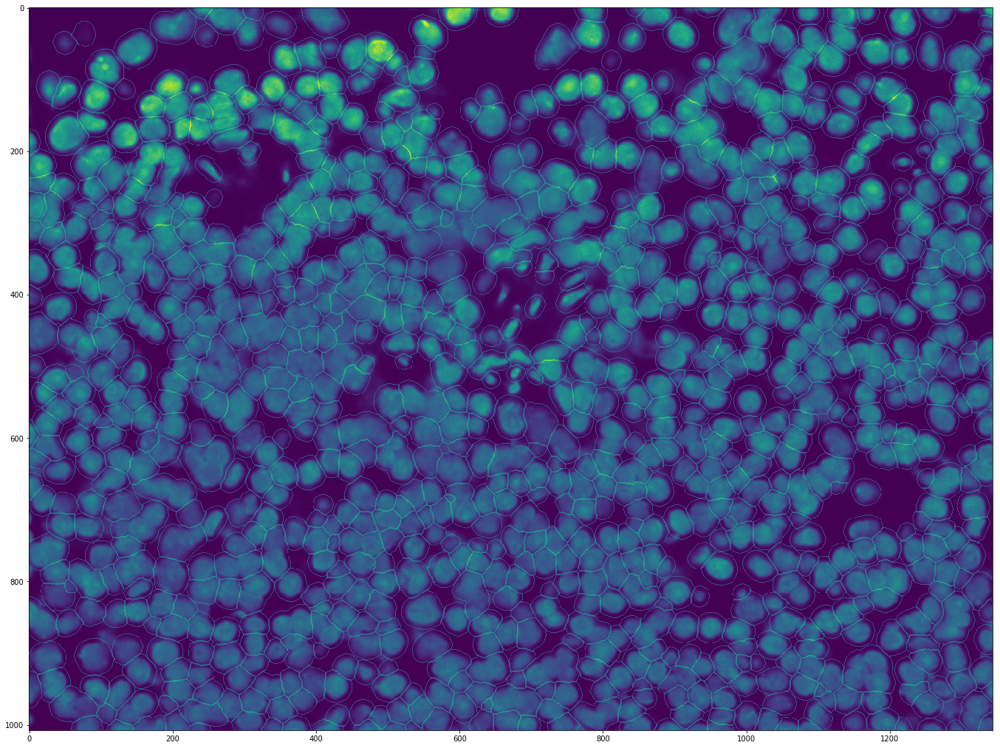

In [31]:
# Cell segmentation
img_bin = (img_label[1, z, 0] > 0).astype(np.uint8) * 255
plt.imshow(.8 * rescale_intensity(img, out_range='uint8') + .2* img_bin)
plt.gcf().set_size_inches(24, 18)

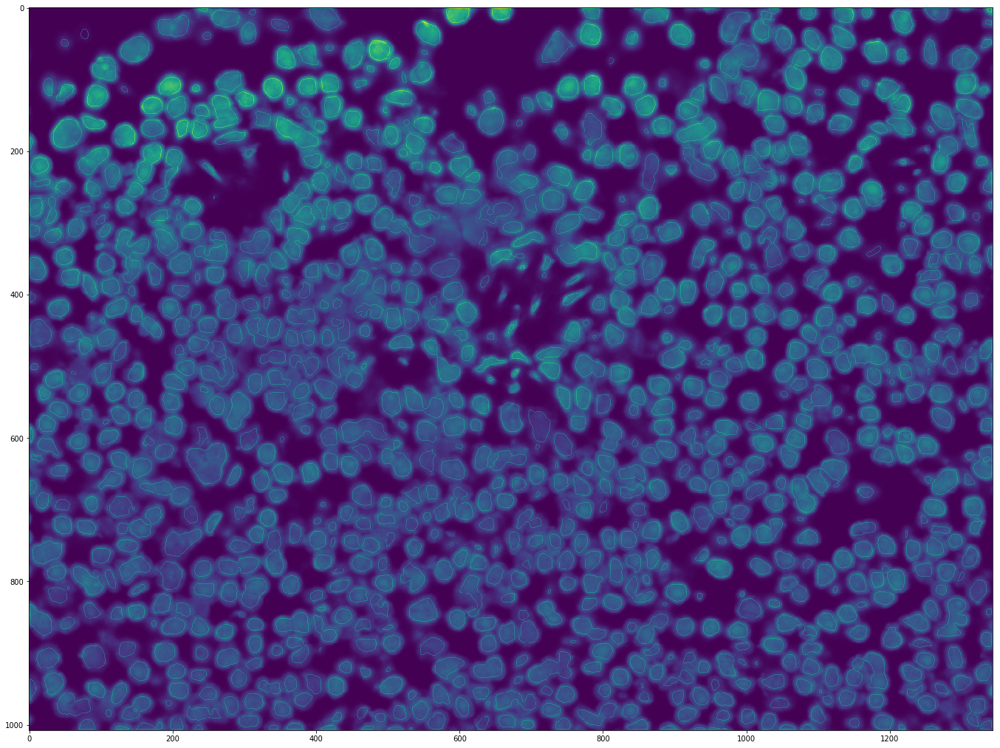

In [23]:
# .5 downsampling (marker dilation = 3)
img_bin = (img_label[1, z, 1] > 0).astype(np.uint8) * 255
plt.imshow(.8 * rescale_intensity(img, out_range='uint8') + .2* img_bin)
plt.gcf().set_size_inches(24, 18)

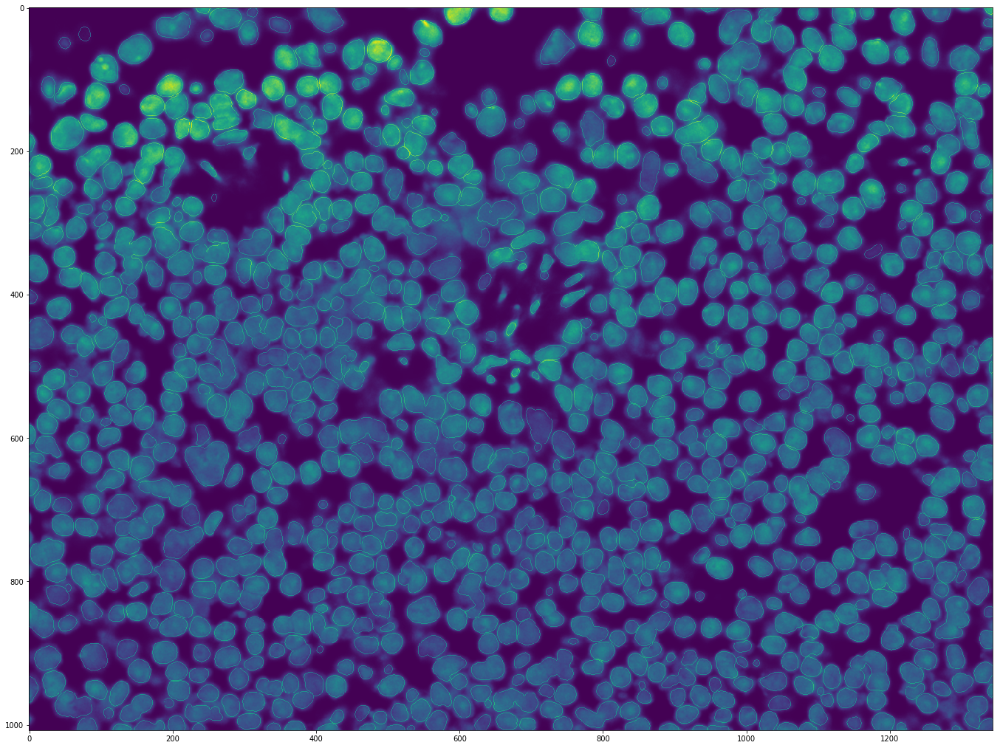

In [10]:
# .5 downsampling (marker dilation = 3)
img_bin = (img_label[1, z, 1] > 0).astype(np.uint8) * 255
plt.imshow(
    .8 * rescale_intensity(img, out_range='uint8') + .2* img_bin
)
plt.gcf().set_size_inches(24, 18)

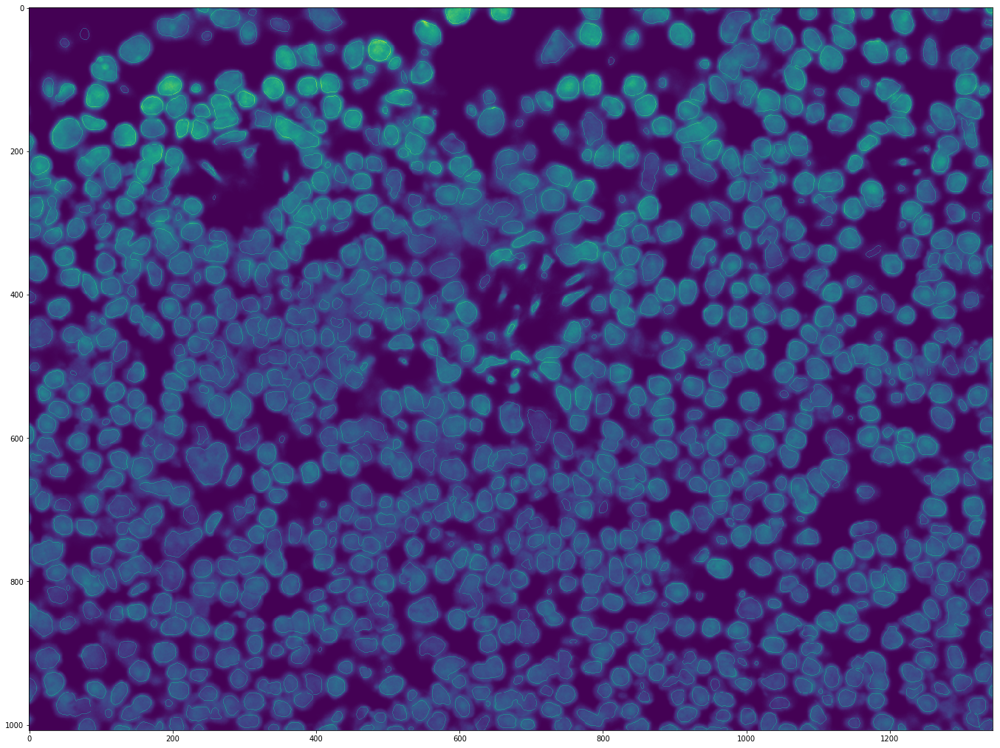

In [17]:
# .5 downsampling (marker dilation = 1)
img_bin = (img_label[1, z, 1] > 0).astype(np.uint8) * 255
plt.imshow(
    .8 * rescale_intensity(img, out_range='uint8') + .2* img_bin
)
plt.gcf().set_size_inches(24, 18)